In [1]:
# blog :
# https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/
# https://ai.facebook.com/tools/detectron2/

# Detectron2 Beginner's Tutorial : Colab
# https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5

# Detectron2 Model Zoo and Baselines :
# https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md

In [1]:
# Mounting Google Drive
from google.colab import drive
drive.mount("/content/drive")


Mounted at /content/drive


# **Install Detectron2**

In [2]:
# install dependencies: 
!pip install pyyaml==5.1
# workaround: install old version of pytorch since detectron2 hasn't released packages for pytorch 1.9 (issue: https://github.com/facebookresearch/detectron2/issues/3158)
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

# install detectron2 that matches pytorch 1.8
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 37.0 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=a2295ecf8180428ed68485f6882b6f7f6c632fee26a609837416be2412b0acba
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.0 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org

In [1]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.8")   # please manually install torch 1.8 if Colab changes its default version


1.8.0+cu101 True


# **Instance Segmentation**

In [2]:
"""
You can use this package to convert labelme annotations to COCO format.
https://github.com/fcakyon/labelme2coco
"""
#!pip install labelme2coco
!pip install labelme2coco==0.1.2


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
# import package
import labelme2coco

# set directory that contains labelme annotations and image files
labelme_folder_train = "/content/drive/MyDrive/Trainning/Detectron/Breat_canser/train/"
labelme_folder_test  = "/content/drive/MyDrive/Trainning/Detectron/Breat_canser/test/"
# set path for coco json to be saved
save_json_path_train = "/content/drive/MyDrive/Trainning/Detectron/Breat_canser/train/train_coco.json"
save_json_path_test  = "/content/drive/MyDrive/Trainning/Detectron/Breat_canser/test/test_coco.json"
# convert labelme annotations to coco
labelme2coco.convert(labelme_folder_train, save_json_path_train)
labelme2coco.convert(labelme_folder_test, save_json_path_test)

print("Done...")


Done...


In [4]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

# Register Custom Detectron2 Data
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/Trainning/Detectron/Breat_canser/train/train_coco.json", "/content/drive/MyDrive/Trainning/Detectron/Breat_canser/train")
register_coco_instances("my_dataset_test", {},  "/content/drive/MyDrive/Trainning/Detectron/Breat_canser/test/test_coco.json", "/content/drive/MyDrive/Trainning/Detectron/Breat_canser/test")

print("Done...")


Done...


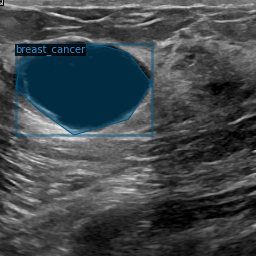

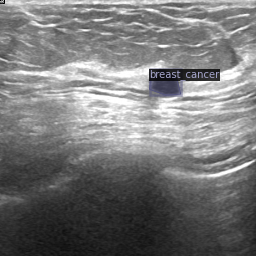

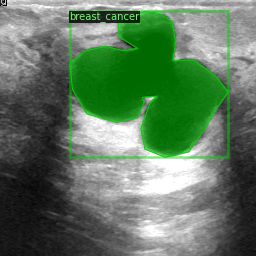

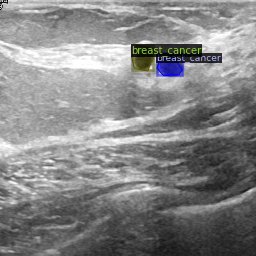

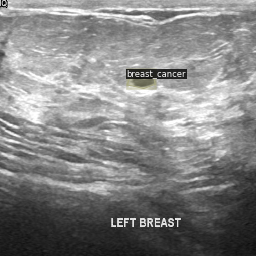

In [5]:
# visualize training data
from detectron2.data import MetadataCatalog, DatasetCatalog
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer
import cv2
from google.colab.patches import cv2_imshow
for d in random.sample(dataset_dicts, 5):
    img = cv2.imread(d["file_name"])
    #cv2_imshow(img)
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])
    print("\n")
    

In [6]:
# Train the model
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
from detectron2 import model_zoo

# mask_rcnn

model_link = "COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"

# Detectron2.config package
# https://detectron2.readthedocs.io/modules/config.html

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(model_link))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model_link) 
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025 
cfg.SOLVER.MAX_ITER = 600  
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()



[10/13 03:18:18 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_a3ec72.pkl: 254MB [01:40, 2.54MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[10/13 03:20:02 d2.engine.train_loop]: Starting training from iteration 0
[10/13 03:20:11 d2.utils.events]:  eta: 0:04:14  iter: 19  total_loss: 2.059  loss_cls: 0.6728  loss_box_reg: 0.7003  loss_mask: 0.6891  loss_rpn_cls: 0.01175  loss_rpn_loc: 0.003563  time: 0.4352  data_time: 0.0171  lr: 8.1588e-06  max_mem: 2573M
[10/13 03:20:21 d2.utils.events]:  eta: 0:04:14  iter: 39  total_loss: 1.979  loss_cls: 0.5695  loss_box_reg: 0.6857  loss_mask: 0.6721  loss_rpn_cls: 0.01203  loss_rpn_loc: 0.003865  time: 0.4487  data_time: 0.0084  lr: 1.6484e-05  max_mem: 2573M
[10/13 03:20:30 d2.utils.events]:  eta: 0:04:05  iter: 59  total_loss: 1.785  loss_cls: 0.4293  loss_box_reg: 0.7171  loss_mask: 0.6314  loss_rpn_cls: 0.00834  loss_rpn_loc: 0.003767  time: 0.4565  data_time: 0.0075  lr: 2.4809e-05  max_mem: 2573M
[10/13 03:20:39 d2.utils.events]:  eta: 0:03:58  iter: 79  total_loss: 1.644  loss_cls: 0.3541  loss_box_reg: 0.7048  loss_mask: 0.5808  loss_rpn_cls: 0.003467  loss_rpn_loc: 0.00362

In [7]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output


<IPython.core.display.Javascript object>

In [8]:
# Test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.engine import DefaultPredictor
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.50
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)


WARNING [10/13 03:27:31 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[10/13 03:27:31 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/drive/MyDrive/Trainning/Detectron/Breat_canser/test/test_coco.json
[10/13 03:27:31 d2.data.build]: Distribution of instances among all 1 categories:
|   category    | #instances   |
|:-------------:|:-------------|
| breast_cancer | 5            |
|               |              |
[10/13 03:27:31 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[10/13 03:27:31 d2.data.common]: Serializing 5 elements to byte tensors and concatenating them all ...
[10/13 03:27:31 d2.data.common]: Serialized dataset takes 0.00 MiB
[10/13 03:27:31 d2.evaluation.evaluator]: Start inference on 5 batches
[10/13 03:27:32 d2.evaluation.evaluator]: To

OrderedDict([('bbox',
              {'AP': 62.07920792079208,
               'AP50': 100.0,
               'AP75': 80.19801980198021,
               'APs': nan,
               'APm': nan,
               'APl': 62.07920792079208}),
             ('segm',
              {'AP': 67.29372937293729,
               'AP50': 100.0,
               'AP75': 80.19801980198021,
               'APs': nan,
               'APm': nan,
               'APl': 68.59735973597361})])

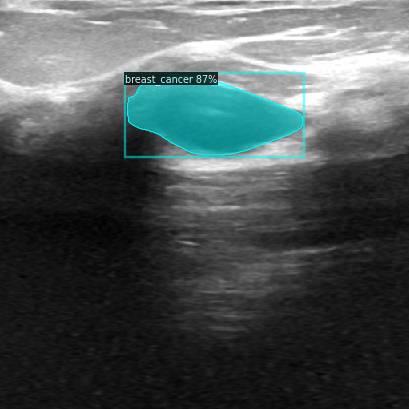

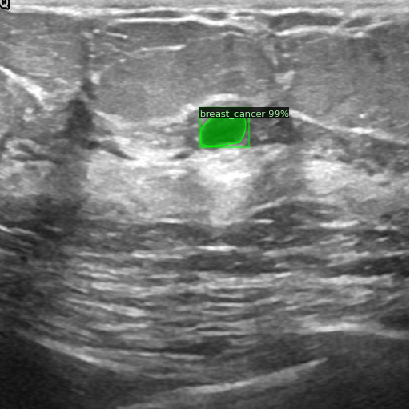

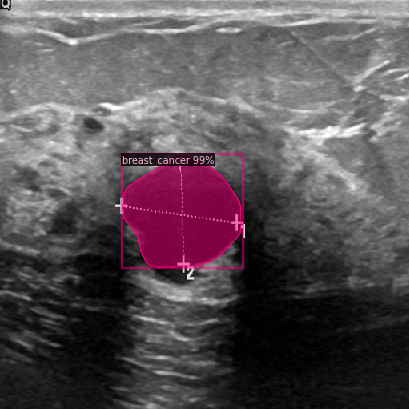

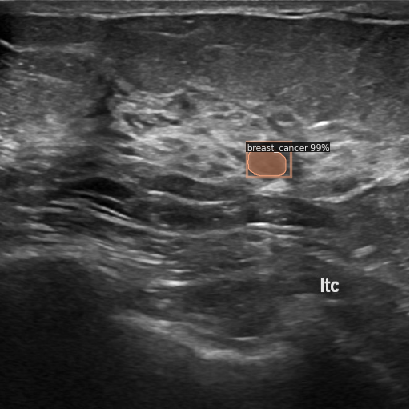

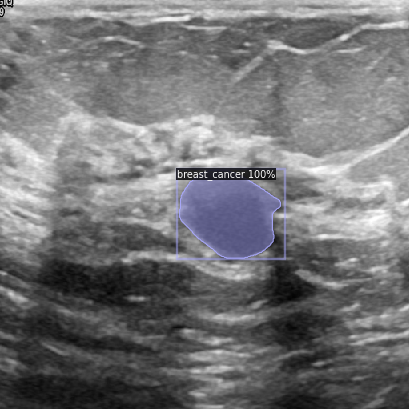

In [9]:
# Inference & evaluation using the trained model
# cfg already contains everything we've set previously. Now we changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")


from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob("/content/drive/MyDrive/Trainning/Detectron/Breat_canser/test/*png"):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  print("\n")


In [10]:
# Save model_final.pth 
%cp /content/output/model_final.pth  /content/drive/MyDrive/Trainning/Detectron/Breat_canser


# **Using Saved Model**

In [11]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Mounting Google Drive
from google.colab import drive
drive.mount("/content/drive")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.8663], device='cuda:0')


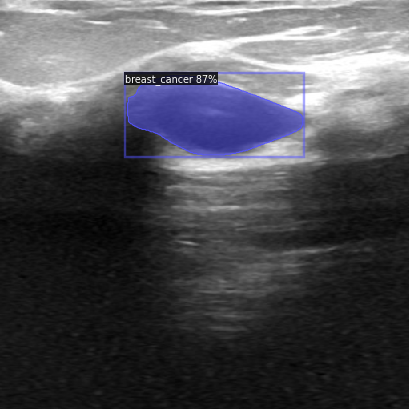



Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9936], device='cuda:0')


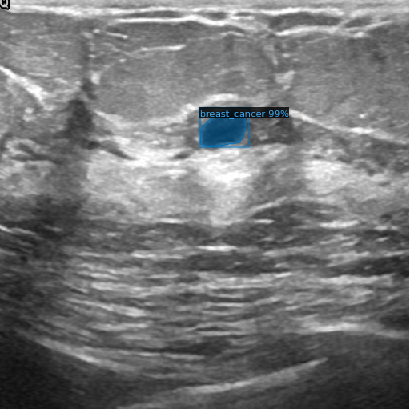



Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9882], device='cuda:0')


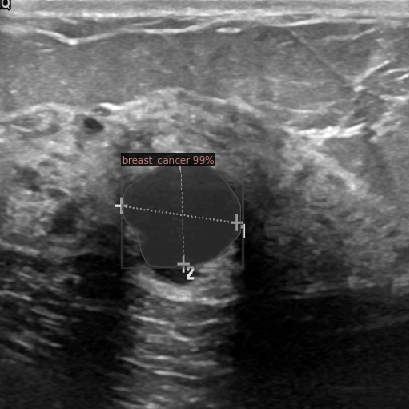



Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9894], device='cuda:0')


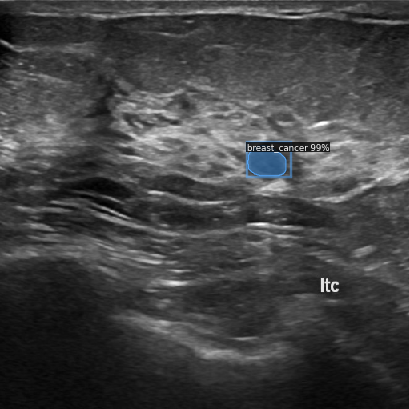



Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9951], device='cuda:0')


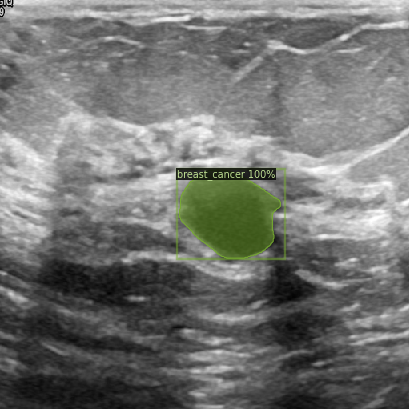

In [12]:
# Using saved model
my_cfg = get_cfg()
my_cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
my_cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # Set threshold for this model
my_cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"
my_cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
my_model_detectron2 = DefaultPredictor(my_cfg)


from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob("/content/drive/MyDrive/Trainning/Detectron/Breat_canser/test/*png"):
  im = cv2.imread(imageName)
  outputs = my_model_detectron2(im)
  print("Classes : \n", outputs["instances"].pred_classes)
  print("Scores : \n", outputs["instances"].scores)

  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  print("\n")
  

In [13]:
!pip install gradio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.3 MB 28.3 MB/s 
     |████████████████████████████████| 55 kB 4.0 MB/s 
     |████████████████████████████████| 84 kB 4.6 MB/s 
     |████████████████████████████████| 84 kB 4.2 MB/s 
     |████████████████████████████████| 54 kB 4.2 MB/s 
     |████████████████████████████████| 270 kB 73.7 MB/s 
     |████████████████████████████████| 212 kB 64.0 MB/s 
     |████████████████████████████████| 57 kB 6.7 MB/s 
     |████████████████████████████████| 112 kB 61.4 MB/s 
     |████████████████████████████████| 2.3 MB 47.4 MB/s 
     |████████████████████████████████| 63 kB 2.8 MB/s 
     |████████████████████████████████| 80 kB 11.0 MB/s 
     |████████████████████████████████| 68 kB 7.8 MB/s 
     |████████████████████████████████| 46 kB 5.2 MB/s 
     |████████████████████████████████| 4.0 MB 56.9 MB/s 
     |████████████████████████████████| 856 kB 6

In [14]:
# https://www.gradio.app

# Using saved model
my_cfg = get_cfg()
my_cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
my_cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # Set threshold for this model
my_cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"
my_cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
my_model_detectron2 = DefaultPredictor(my_cfg)

from detectron2.utils.visualizer import ColorMode

import numpy as np
import gradio as gr
import requests
#from PIL import Image
import cv2

def inference(img):
    H,W = 416, 416
    img = cv2.resize(img, (H, W)) 
    outputs = my_model_detectron2(img)
    v = Visualizer(img[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    return out.get_image()[:, :, ::-1]

gr.Interface(fn=inference, 
             inputs=gr.inputs.Image(), 
             outputs=gr.outputs.Image(),
             theme="dark").launch(share=True) #debug=True Use in Colab


/usr/local/lib/python3.7/dist-packages/gradio/inputs.py:257: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  "Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components",
/usr/local/lib/python3.7/dist-packages/gradio/deprecation.py:40: UserWarning: `optional` parameter is deprecated, and it has no effect
  warnings.warn(value)
/usr/local/lib/python3.7/dist-packages/gradio/outputs.py:43: UserWarning: Usage of gradio.outputs is deprecated, and will not be supported in the future, please import your components from gradio.components
  "Usage of gradio.outputs is deprecated, and will not be supported in the future, please import your components from gradio.components",
/usr/local/lib/python3.7/dist-packages/gradio/interface.py:328: UserWarning: Currently, only the 'default' theme is supported.
  warnings.warn("Currently, o

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://20773.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces: https://huggingface.co/spaces


(<gradio.routes.App at 0x7ff7acde15d0>,
 'http://127.0.0.1:7860/',
 'https://20773.gradio.app')